# Style Transfer of MRI Images Using CycleGAN

## Problem statement:
To build a Generative adversarial model(modified U-Net) which can generate artificial MRI images of different contrast levels from existing MRI scans.

#### Brief Explanation
Misdiagnosis in the medical field is a very serious issue but it’s also uncomfortably common to occur. Imaging procedures in the medical field requires an expert radiologist’s opinion since interpreting them is not a simple binary process ( Normal or Abnormal). Even so, one radiologist may see something that another does not. This can lead to conflicting reports and make it difficult to effectively recommend treatment options to the patient.

One of the complicated tasks in medical imaging is to diagnose MRI(Magnetic Resonance Imaging). Sometimes to interpret the scan, the radiologist needs different variations of the imaging which can drastically enhance the accuracy of diagnosis by providing practitioners with a more comprehensive understanding.

But to have access to different imaging is difficult and expensive. With the help of deep learning, we can use style transfer to generate artificial MRI images of different contrast levels from existing MRI scans. This will help to provide a better diagnosis with the help of an additional image.

In this project, CycleGAN has been used to translate the style of one MRI image to another, which will help in a better understanding of the scanned image. Using GANs, T2 weighted images are generated from T1 weighted MRI image and vice-versa.

## Pipeline

1. Data Understanding
  - Basic EDA
  - Data loading & visualization
2. Image Processing
  - Data normalization
  - Data resizing
  - Data reshaping
  - Batch and shuffling of data
3. Model-Building and Training

Import the required Libraries

In [ ]:
import numpy as np
import tensorflow as tf

import matplotlib.pyplot as plt
import imageio
import cv2
import os
import glob
import pathlib

from tensorflow import keras
from tensorflow.keras import layers, Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Activation, Flatten, Conv2D, Conv2DTranspose
from google.colab import drive

Mount the drive

In [ ]:
drive.mount('/content/drive')
os.chdir("/content/drive/MyDrive/MSUOA/CycleGAN/")
os.getcwd()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


'/content/drive/MyDrive/MSUOA/CycleGAN'

**Data loading and visualization**

In [ ]:
t1_image=[]
t2_image=[]

In [ ]:
data_dir_T1 = pathlib.Path("/content/drive/MyDrive/MSUOA/CycleGAN/MRI+T1_T2+Dataset/Tr1/TrainT1")
data_dir_T2 = pathlib.Path("/content/drive/MyDrive/MSUOA/CycleGAN/MRI+T1_T2+Dataset/Tr2/TrainT2")

print("Path for T1 data : \n", data_dir_T1)
print("Path for T2 data : \n", data_dir_T2)

Path for T1 data : 
 /content/drive/MyDrive/MSUOA/CycleGAN/MRI+T1_T2+Dataset/Tr1/TrainT1
Path for T2 data : 
 /content/drive/MyDrive/MSUOA/CycleGAN/MRI+T1_T2+Dataset/Tr2/TrainT2


## Data Understanding

### Basic EDA

Check the shape of an image

In [ ]:
sample_t1_image = cv2.imread(os.path.join(data_dir_T1, 'Image #10.png'))
sample_t1_image.shape

(217, 181, 3)

In [ ]:
sample_t2_image = cv2.imread(os.path.join(data_dir_T2, 'Image #70.png'))
sample_t2_image.shape

(217, 181, 3)

In [ ]:
image_count_t1 = len(list(data_dir_T1.glob('*.png')))
print("No. of images in T1 dataset: ", image_count_t1)
image_count_t2 = len(list(data_dir_T2.glob('*.png')))
print("No. of images in T2 dataset: ", image_count_t2)

No. of images in T1 dataset:  43
No. of images in T2 dataset:  46


In [ ]:
IMG_HEIGHT = 217
IMG_WEIGHT = 181
BATCH_SIZE = 64

### Load the Images

In [ ]:
# Loading T1 images
images_T1 = image_dataset_from_directory(data_dir_T1,seed=100, shuffle = True, labels = None,
                                         image_size=(IMG_HEIGHT,IMG_WEIGHT),batch_size=BATCH_SIZE)

Found 43 files belonging to 1 classes.


In [ ]:
# loading T2 images
images_T2 = image_dataset_from_directory(data_dir_T2,seed=100, shuffle = True, labels = None,
                                         image_size=(IMG_HEIGHT,IMG_WEIGHT),batch_size=BATCH_SIZE)

Found 46 files belonging to 1 classes.


**Data visualization of image containing T1 and T2**

In [ ]:
type(images_T1)

tensorflow.python.data.ops.batch_op._BatchDataset

T1 data examples


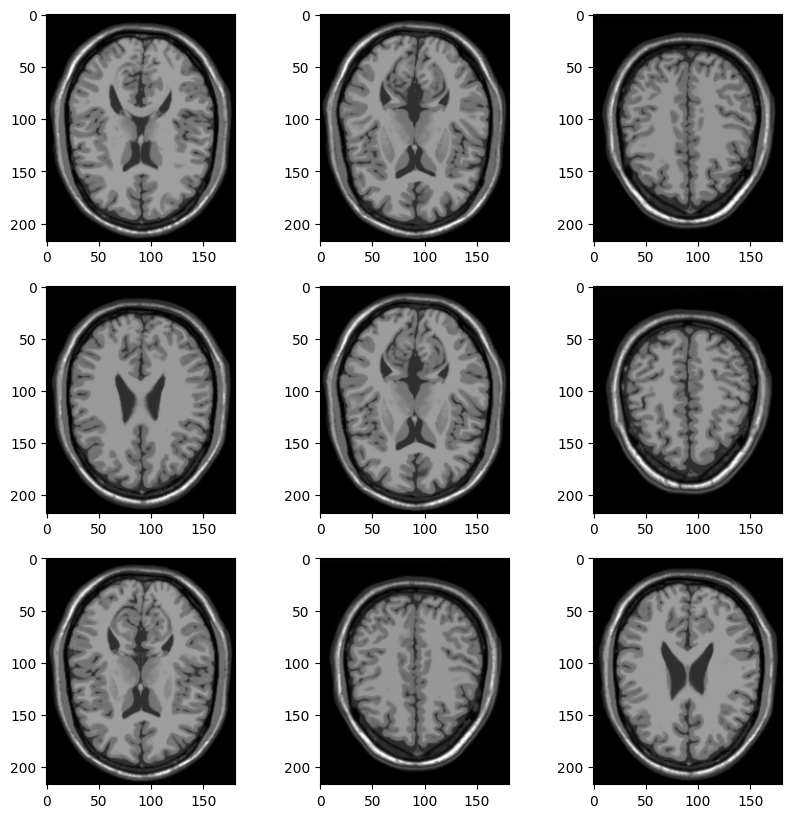

In [ ]:
# Visualizing data from T1 dataset
plt.figure(figsize=(10,10))
for images in images_T1.take(1):
  print("T1 data examples")
  for i in range(9):
    ax = plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))

T2 data examples


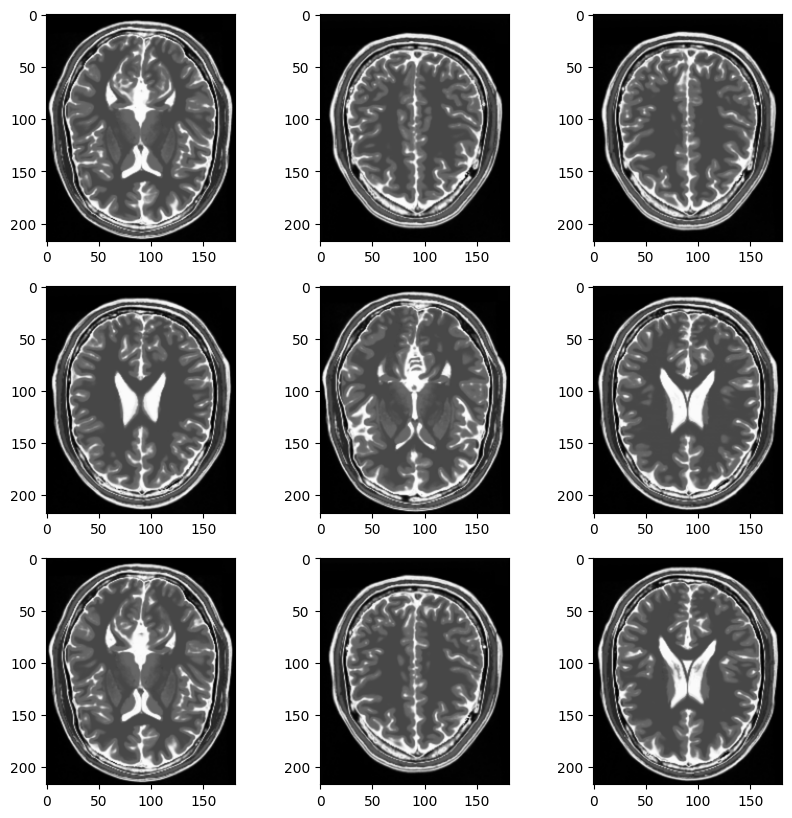

In [ ]:
# Visualizing data from T2 dataset
plt.figure(figsize=(10,10))
for images in images_T2.take(1):
  print("T2 data examples")
  for i in range(9):
    ax = plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))

In [ ]:
# Checking range of values of the pixels in image in T1 data
images_batch_t1 = next(iter(images_T1))
image1 = images_batch_t1[0]
print("Pixel range in T1 image:",np.min(image1),np.max(image1))

# Checking range of values of the pixels in image in T2 data
images_batch_t2 = next(iter(images_T2))
image2 = images_batch_t2[0]
print("Pixel range in T2 image:",np.min(image2),np.max(image2))

Pixel range in T1 image: 0.0 255.0
Pixel range in T2 image: 0.0 255.0


## Data Preprocessing
1. Data Normalization
2. Data Resizing
3. Data Reshaping
4. Batch and Shuffle Data

### Normalize the data

In [ ]:
# Define normalization function - Normalizing data in the range [-1.0, 1.0]
normalization_layer = layers.experimental.preprocessing.Rescaling(scale = 1./127.5, offset =-1.0)

In [ ]:
# Normalizing T1 data
images_T1_norm = images_T1.map(lambda x:(normalization_layer(x)))
# Check if the images are normalized
image_batch1 = next(iter(images_T1_norm))
image_test = image_batch1[0]
print("Minimum and maximum pixel values after normalization")
print(np.min(image_test), np.max(image_test))

Minimum and maximum pixel values after normalization
-1.0 1.0


In [ ]:
images_T1_batch  = next(iter(images_T1_norm))
images_T1_batch.shape

TensorShape([43, 217, 181, 3])

In [ ]:
# Normalizing T2 data
images_T2_norm = images_T2.map(lambda x:(normalization_layer(x)))
# Check if the images are normalized
image_batch2 = next(iter(images_T2_norm))
image_test = image_batch2[0]
print("Minimum and maximum pixel values after normalization")
print(np.min(image_test), np.max(image_test))

Minimum and maximum pixel values after normalization
-1.0 1.0


In [ ]:
images_T2_batch  = next(iter(images_T2_norm))
images_T2_batch.shape

TensorShape([46, 217, 181, 3])

**Data visualization of image containing T1 and T2 after normalization**

T1 data examples after normalization


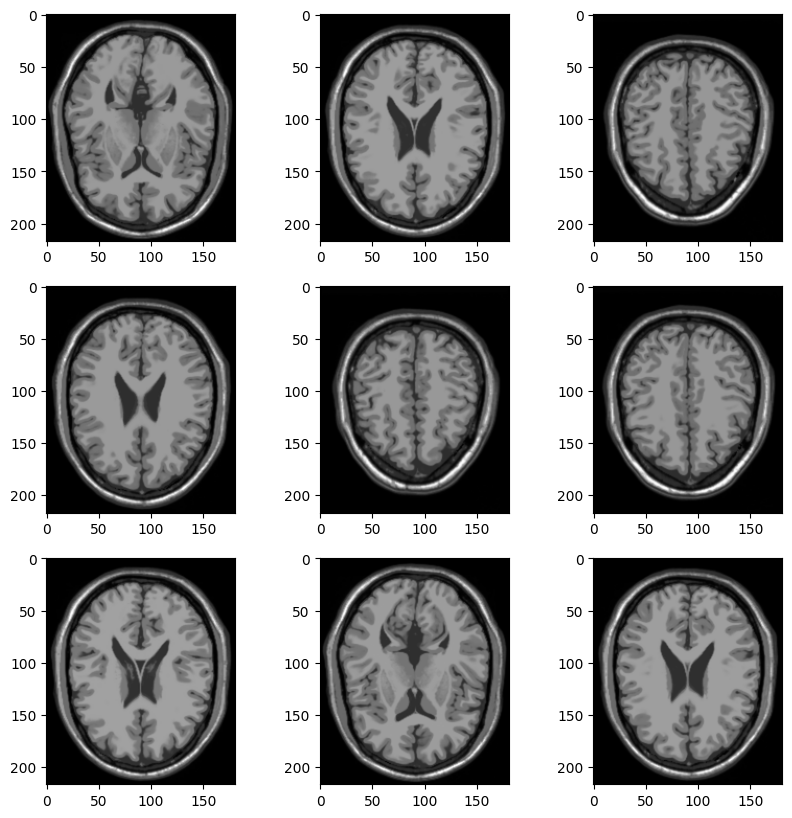

In [ ]:
# Visualizing data from T1 dataset after normalization
plt.figure(figsize=(10,10))
for images in images_T1_norm.take(1):
  print("T1 data examples after normalization")
  for i in range(9):
    ax = plt.subplot(3,3,i+1)
    plt.imshow((images[i]*127.5+127.5).numpy().astype("uint8"))  # Reverse the scaling for visualization

T2 data examples after normalization


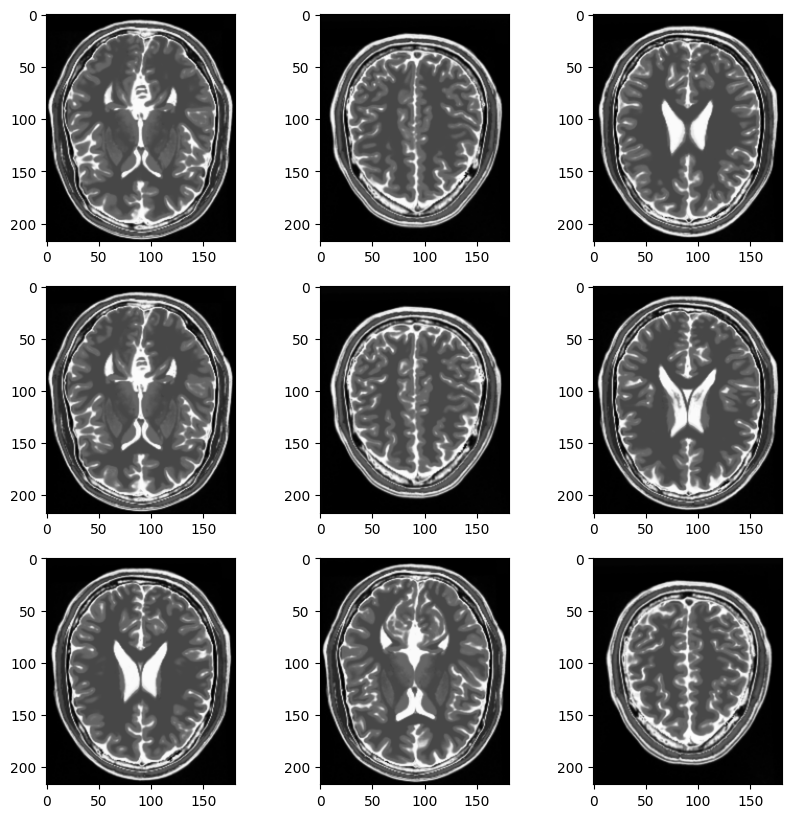

In [ ]:
# Normalizing T2 data
plt.figure(figsize=(10,10))
for images in images_T2_norm.take(1):
  print("T2 data examples after normalization")
  for i in range(9):
    ax = plt.subplot(3,3,i+1)
    plt.imshow((images[i]*127.5+127.5).numpy().astype("uint8")) # Reverse the scaling for visualization

Resize the images to size (128,128)

In [ ]:
# Define resizing function
resize_layer = layers.experimental.preprocessing.Resizing(128,128,interpolation='bilinear')

Shape of resized images:  (128, 128, 3) 



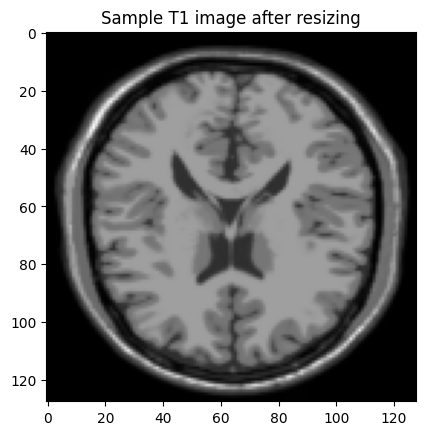

In [ ]:
# Resizing T1 data
images_T1_resized = images_T1_norm.map(lambda x: (resize_layer(x)))

# Obtaining a batch of T1 data.
image_batch = next(iter(images_T1_resized))
first_image = image_batch[0]
print("Shape of resized images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T1 data.
plt.imshow((first_image * 127.5 + 127.5).numpy().astype("uint8")) # reverse the scaling for visualization
plt.title("Sample T1 image after resizing")
plt.show()

Check the images of different channel

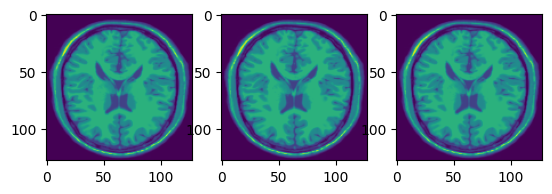

In [ ]:
ax = plt.subplot(1,3,1)
plt.imshow(first_image[:,:,0]) #Red channel
ax = plt.subplot(1,3,2)
plt.imshow(first_image[:,:,1]) #Green channel
ax = plt.subplot(1,3,3)
plt.imshow(first_image[:,:,2]) #Blue channel

Shape of resized images:  (128, 128, 3) 



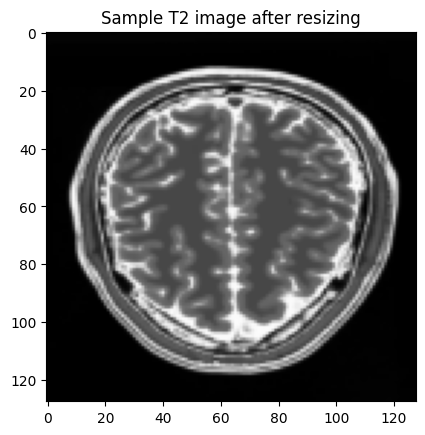

In [ ]:
# Resizing T2 data
images_T2_resized = images_T2_norm.map(lambda x: (resize_layer(x)))

# Obtaining a batch of T2 data.
image_batch = next(iter(images_T2_resized))
first_image = image_batch[0]
print("Shape of resized images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T2 data.
plt.imshow((first_image * 127.5 + 127.5).numpy().astype("uint8")) # reverse the scaling for visualization
plt.title("Sample T2 image after resizing")
plt.show()

Check the images of different channel

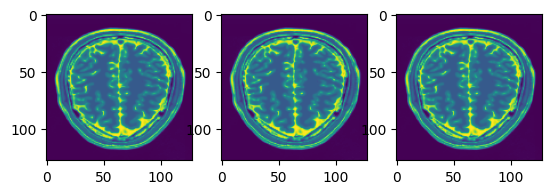

In [ ]:
ax = plt.subplot(1,3,1)
plt.imshow(first_image[:,:,0]) #Red channel
ax = plt.subplot(1,3,2)
plt.imshow(first_image[:,:,1]) #Green channel
ax = plt.subplot(1,3,3)
plt.imshow(first_image[:,:,2]) #Blue channel

### Batch and reshuffle data

- Shuffling the data to remove any continuity bias
- The data already exists as a batch since the number of images is relatively small. We consider the entire dataset for each type as a batch for that type.

In [ ]:
# Shuffling the data
T1_data = images_T1_resized.shuffle(BATCH_SIZE)
T2_data = images_T2_resized.shuffle(BATCH_SIZE)

Shape of T1 image batch:  (43, 128, 128, 3)


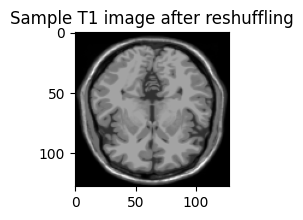

In [ ]:
# Obtaining a batch of T1 data.
sample_T1_data = next(iter(T1_data))
print("Shape of T1 image batch: ", sample_T1_data.shape)
plt.figure(figsize=(2,2))
plt.imshow(sample_T1_data[0].numpy()[:,:,0],cmap='gray')
plt.title('Sample T1 image after reshuffling')
plt.show()

Shape of T2 image batch:  (46, 128, 128, 3)


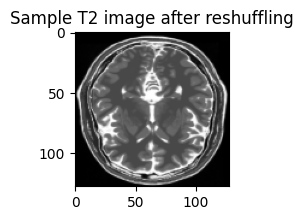

In [ ]:
# Obtaining a batch of T2 data.
sample_T2_data = next(iter(T2_data))
print("Shape of T2 image batch: ", sample_T2_data.shape)
plt.figure(figsize=(2,2))
plt.imshow(sample_T2_data[0].numpy()[:,:,0],cmap='gray')
plt.title('Sample T2 image after reshuffling')
plt.show()

## Model Building
1. Instance Normalization
2. Downsampling, Upsampling and Unet
3. Generator Building using Unet
4. Discriminator Building

### Instance Normalization

Instance Normalization are specially used with Style Transfer, where Separate Normalization is performed for each sample we perform channelwise Normalization.


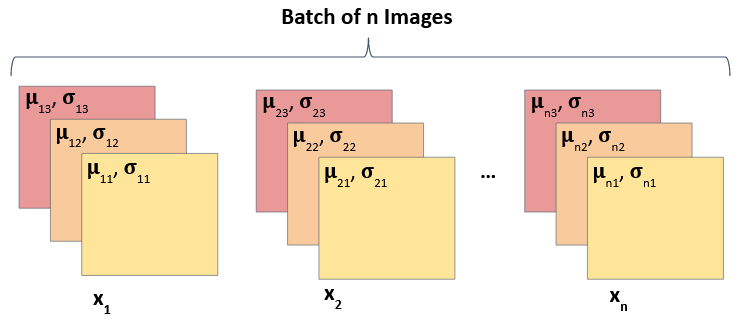

In [ ]:
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

### Downsampling
- Uses Conv2D layers
- Reduces the dimension with each new layer

In [ ]:
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

### Upsampling

- Uses Transposed Convolution layers
- Increases the dimensions

In [ ]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

### Unets
- Unets take images as input and translate it into another Image. <p>
- To do this they first use Downsampling on Input Image to learn the latent characteristics of input image and then use Upsampling to use this knowledge to translate it into another image. <p>
- The last layer in the downsampling process is the bottleneck layer. <p>
- Each downsampling layer (except the bottleneck layer) has a corresponding upsampling layer. <p>
- An important characteristic is the use of skip connections, which retain the background information from the downsampling layers and transfer them to the corresponding upsampling layer. Bottleneck layer, obviously, has no skip connections.

<center>

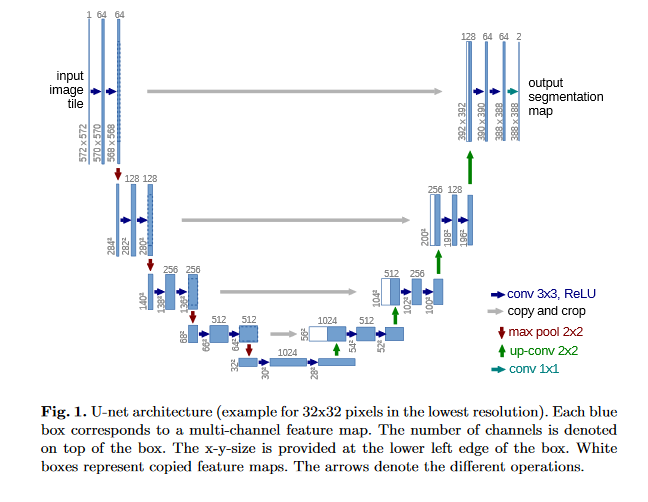

</center>

In [ ]:
#Unet Generator is a combination of Convolution + Transposed Convolution Layers
def unet_generator():
  down_stack=[
      downsample(64,4,True),#(Output size: 64 X 64, 64)
      downsample(64,4),     #(Output size: 32 X 32, 64)
      downsample(128,4),    #(Output size: 16 X 16, 128)
      downsample(128,4),    #(Output size: 8 X 8, 128)
      downsample(256,4),    #(Output size: 4 X 4, 256)
      downsample(256,4),    #(Output size: 2 X 2, 256)
      downsample(512,4)    #(Output size: 1 X 1, 512)
  ]
  up_stack = [
      upsample(256,4,True), #(Output size: 2 X 2, 256)
      upsample(256,4),      #(Output size: 4 X 4, 256)
      upsample(128,4),      #(Output size: 8 X 8, 128)
      upsample(128,4),      #(Output size: 16 X 16, 128)
      upsample(64,4),      #(Output size: 32 X 32, 64)
      upsample(64,4)      #(Output size: 64 X 64, 64)
  ]
  initializer = tf.random_normal_initializer(0.,0.02)
  last = tf.keras.layers.Conv2DTranspose(3,4, strides=2, padding = 'same', kernel_initializer=initializer,
                                         activation='tanh') #(Output size: 128 X 128, 3)

  # Apply skip connections
  concat = tf.keras.layers.Concatenate()
  inputs = tf.keras.layers.Input(shape=[128,128,3])
  x = inputs

  # Downsampling through the model
  skips_connect = []  # List to store downsampling layers' latent information
  for down in down_stack:
    x = down(x)
    skips_connect.append(x)
  skips_connect = reversed(skips_connect[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack,skips_connect):
    x = up(x)
    x = concat([x,skip])  # Concat skip connections with Up-sampling layers
  x = last(x)
  return tf.keras.Model(inputs = inputs, outputs = x)


### Generators
Generator is a Unet Network since we want to translate T1 images to T2 and vice-versa.

In [ ]:
# Defining generator models - The generator models for both the image types have identical structures.
generator_T1 = unet_generator()   # For generating T1 images
generator_T2 = unet_generator()   # For generating T2 images

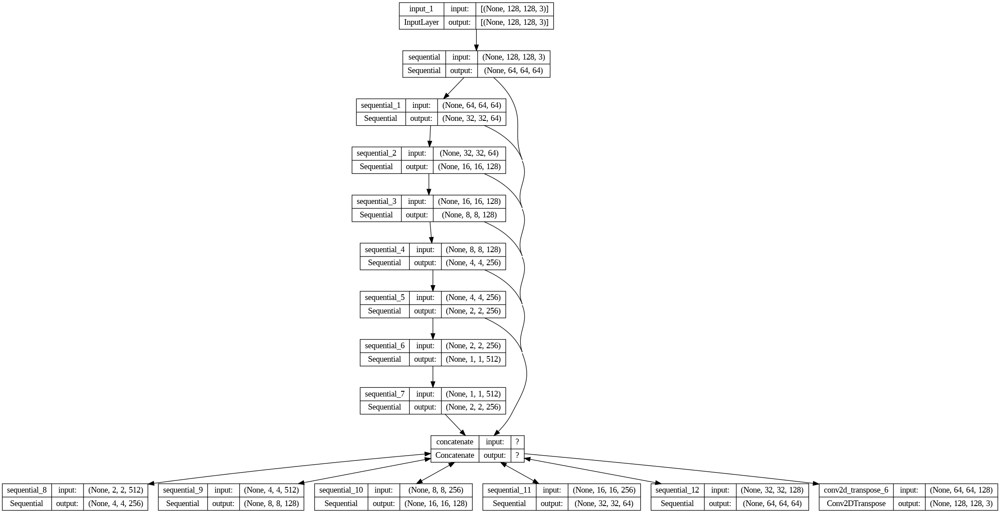

In [ ]:
# Visualize generator model architecture
plot_model(generator_T1, show_shapes=True, show_layer_names=True)

In [ ]:
generator_T1.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 64, 64, 64)   3200        ['input_1[0][0]']                
                                                                                                  
 sequential_1 (Sequential)      (None, 32, 32, 64)   65664       ['sequential[0][0]']             
                                                                                                  
 sequential_2 (Sequential)      (None, 16, 16, 128)  131328      ['sequential_1[0][0]']       

### Checking output of untrained generator

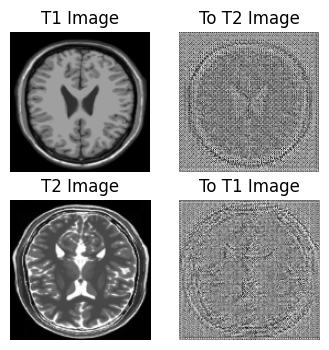

In [ ]:
sample_T1_data = next(iter(T1_data))
sample_T2_data = next(iter(T2_data))

gen_T2_img = generator_T2(sample_T1_data) # generate T2 image from T1 image
gen_T1_img = generator_T1(sample_T2_data) # generate T1 image from T2 image

#plot the generated Image
plt.figure(figsize=(4,4))
imgs = [sample_T1_data,gen_T2_img,sample_T2_data,gen_T1_img]
title = ['T1 Image','To T2 Image','T2 Image','To T1 Image']

for i in range(len(imgs)):
  plt.subplot(2,2,i+1)
  plt.title(title[i])
  plt.imshow(imgs[i][0].numpy()[:,:,0],cmap='gray')
  plt.axis('off')
plt.show()

### Discriminator
Discriminator is a traditional CNN, which we use to classify the images. Hence, it only uses Downsampling layers.

Both Discriminators have same architecture.

In [ ]:
# Discriminators only contain Convolutional layers and no Transposed Convolution is used.
def discriminator():
  initializer = tf.random_normal_initializer(0.,0.02)
  # add input layer of size (128, 128, 1)
  inp = tf.keras.layers.Input(shape=[128,128,3],name='input_image')
  x = inp

  # add downsampling step here
  down1 = downsample(64,4,False)(x) #(output size: 64X64, 64)
  down2 = downsample(128,4)(down1) #(output size: 32X32, 128)
  down3 = downsample(256,4)(down2) #(output size: 16X16, 256)
  down4 = downsample(512,4)(down3) #(output size: 8X8, 512)

  # add a padding layer here
  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down4) #(output size: 10X10, 512)

  # implement a concrete downsampling layer here
  conv = tf.keras.layers.Conv2D(256, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) #(output size: 7X7, 256)
  norm1 = InstanceNormalization()(conv)
  leaky_relu = tf.keras.layers.LeakyReLU()(norm1)

  # Adding another zero padding layer
  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)   #(output size: 9X9, 256)

  # add a last pure 2D Convolution layer
  last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)   #(output size: 6X6, 1)
  return tf.keras.Model(inputs=inp, outputs=last)

In [ ]:
# Defining discriminators
discriminator_T1 = discriminator()
discriminator_T2 = discriminator()

Have a look at Discriminator's architecture, Notice that The Dimensions are reducing overall at the end since it's a classifier and only Convolution layers are being used.

In [ ]:
discriminator_T2.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 128, 128, 3)]     0         
                                                                 
 sequential_38 (Sequential)  (None, 64, 64, 64)        3072      
                                                                 
 sequential_39 (Sequential)  (None, 32, 32, 128)       131328    
                                                                 
 sequential_40 (Sequential)  (None, 16, 16, 256)       524800    
                                                                 
 sequential_41 (Sequential)  (None, 8, 8, 512)         2098176   
                                                                 
 zero_padding2d_6 (ZeroPaddi  (None, 10, 10, 512)      0         
 ng2D)                                                           
                                                           

## Model Training
1. Declare Loss type
2. Calculate Discriminator Loss
3. Calculate Generator Loss
4. Cycle Loss
5. Identity Loss
6. Optimizer
7. Checkpoint Initialization
8. Training Flow

### Declare Loss as Binary Cross Entropy, since Our Discriminator is a classifier

In [ ]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#### Discriminator Loss
It consists of two types of losses
1.    Loss on Real Data
2.    Loss on Fake Data

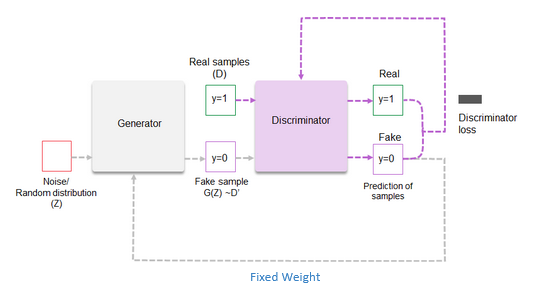

In [ ]:
def discriminator_loss(real,generated):
  real_loss = loss_obj(tf.ones_like(real),real)
  generated_loss = loss_obj(tf.zeros_like(generated),generated)
  total_disc_loss =real_loss+generated_loss
  return total_disc_loss*0.5 # mean of losses

### Generator Loss

It has only one type of loss - Discriminator Loss on Generated data

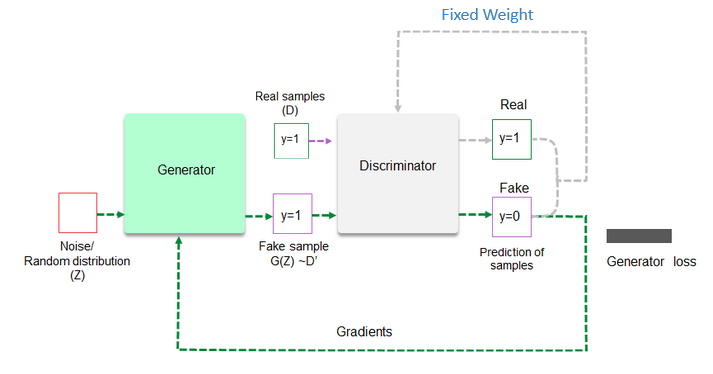

In [ ]:
def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

### Cycle Loss
When we use both of Generators sequentially on a Input Image, we get Cycle Image and the L1 Loss between these two is called Cycle Loss.

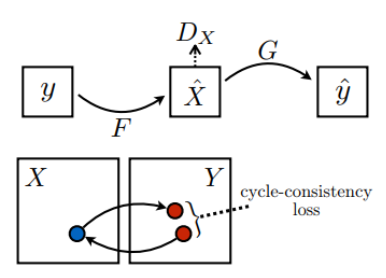

In [ ]:
def calc_cycle_loss(real_image, cycled_image):
    cycle_loss = tf.reduce_mean(tf.abs(real_image - cycled_image))  # Averages out all values in the input
    return 10.0 * cycle_loss                                        # Weight of 10 used as contribution of cycle loss to total loss. This is a hyperparameter.

### Identity Loss
When we provide input image to the Generator such that no translation is needed because the image is already transformed, the difference should be minimal between original and generated image. Here also we take L1 Loss between input and output image.

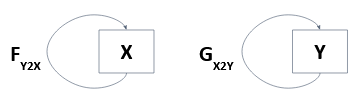

In [ ]:
def identity_loss(real_image, same_image):
    id_loss = tf.reduce_mean(tf.abs(real_image - same_image))       # Averages out all values in the input
    return 2.0 * id_loss                                            # Weight of 2.0 used as contribution of identity loss to total loss. This is a hyperparameter.

### Optimizer definition.

In [ ]:
generator_T1_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_T2_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_T1_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_T2_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

### Checkpoint Initialization
Initialize checkpoints to save models

In [ ]:
# Directory to keep Generated Images each epoch
if not os.path.isdir('generated_images'):
    os.mkdir('generated_images')

# Directory to keep Checkpoints at each epoch
if not os.path.isdir('training_checkpoints'):
    os.mkdir('training_checkpoints')

checkpoint_path = "./training_checkpoints"

ckpt = tf.train.Checkpoint(generator_T1=generator_T1,
                           generator_T2=generator_T2,
                           discriminator_T1=discriminator_T1,
                           discriminator_T2=discriminator_T2,
                           generator_T1_optimizer=generator_T1_optimizer,
                           generator_T2_optimizer=generator_T2_optimizer,
                           discriminator_T1_optimizer=discriminator_T1_optimizer,
                           discriminator_T2_optimizer=discriminator_T2_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

### Training Flow
The function below performs one flow of batch training

Sequence of Training Flow

1.   Generate Fake T2 and Cycled T1
2.   Generate Fake T1 and Cycled T2
3.   Generate Fake Images through T1 and T2 for Identity Loss.
4.   Calculate Discriminator Loss for Disc T1 and Disc T2 on Fake Data for Generator Training.
5.   Calculate Generator Loss on Discriminator.
6.   Calculate Cycled Loss on Cycled Images from step 1 and 2.
7.   Calculate Total Generator Loss - Disc Loss + Cycled Loss + Identity Loss
8.   Calculate Discriminator Loss on both Fake and Real Images for Disc X and Y for Disc Training.
9.   Calculate the Gradients and update the weight and bias of models.

In [ ]:
@tf.function
def train_step(real_T1, real_T2):
    # persistent is set to True because the tape is used more than once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator T2 translates T1 -> T2
        # Generator T1 translates T2 -> T1
        fake_T2 = generator_T2(real_T1, training=True)
        cycled_T1 = generator_T1(fake_T2, training=True)

        fake_T1 = generator_T1(real_T2, training=True)
        cycled_T2 = generator_T2(fake_T1, training=True)

        # same_x and same_y are used for identity loss.
        same_T1 = generator_T1(real_T1, training=True)
        same_T2 = generator_T2(real_T2, training=True)

        disc_real_T1 = discriminator_T1(real_T1, training=True)
        disc_real_T2 = discriminator_T2(real_T2, training=True)

        disc_fake_T1 = discriminator_T1(fake_T1, training=True)
        disc_fake_T2 = discriminator_T2(fake_T2, training=True)

        # calculate generator loss
        gen_T2_loss = generator_loss(disc_fake_T2)
        gen_T1_loss = generator_loss(disc_fake_T1)

        # Calculate cycle loss
        total_cycle_loss = calc_cycle_loss(real_T1, cycled_T1) + calc_cycle_loss(real_T2, cycled_T2)

        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_T1_loss = gen_T1_loss + total_cycle_loss + identity_loss(real_T1, same_T1)
        total_gen_T2_loss = gen_T2_loss + total_cycle_loss + identity_loss(real_T2, same_T2)

        # Discriminator's loss
        disc_T1_loss = discriminator_loss(disc_real_T1, disc_fake_T1)
        disc_T2_loss = discriminator_loss(disc_real_T2, disc_fake_T2)

    # Calculate the gradients for generator and discriminator
    generator_T1_gradients = tape.gradient(total_gen_T1_loss, generator_T1.trainable_variables)
    generator_T2_gradients = tape.gradient(total_gen_T2_loss, generator_T2.trainable_variables)

    discriminator_T1_gradients = tape.gradient(disc_T1_loss, discriminator_T1.trainable_variables)
    discriminator_T2_gradients = tape.gradient(disc_T2_loss, discriminator_T2.trainable_variables)

    # Apply the gradients to the optimizer
    generator_T1_optimizer.apply_gradients(zip(generator_T1_gradients, generator_T1.trainable_variables))
    generator_T2_optimizer.apply_gradients(zip(generator_T2_gradients, generator_T2.trainable_variables))

    discriminator_T1_optimizer.apply_gradients(zip(discriminator_T1_gradients, discriminator_T1.trainable_variables))
    discriminator_T2_optimizer.apply_gradients(zip(discriminator_T2_gradients, discriminator_T2.trainable_variables))

#### Train the CycleGAN Model for several Epochs
Loop training function for number of epochs and also show the output at each step.

In [ ]:
for image_x in T1_data:
    for image_y in T2_data:
        print(image_x.shape, image_y.shape)

(43, 128, 128, 3) (46, 128, 128, 3)


In [ ]:
# Declaring number of epochs of training
EPOCHS = 300

In [ ]:
# Function to show Images output by Generators while Training
def generate_images(model1, test_input1, model2, test_input2, epoch):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(4, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input T1', 'Predicted T2 - Epoch ' + str(epoch), 'Input T2', 'Predicted T1 - Epoch ' + str(epoch)]
    for i in range(4):
        plt.subplot(2, 2, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('./generated_images/image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

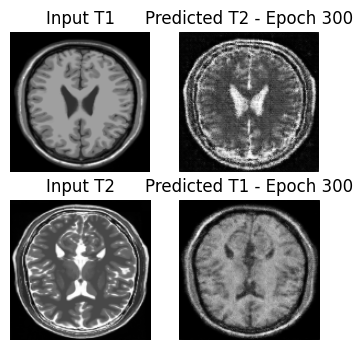

Saving checkpoint for epoch 300 at ./training_checkpoints/ckpt-300


In [ ]:
# Training run - Epochs 1 to 300
for epoch in range(1, EPOCHS+1):
    for image_x in T1_data:
        for image_y in T2_data:
            train_step(image_x, image_y)

    display.clear_output(wait=True)
    generate_images(generator_T2, sample_T1_data, generator_T1, sample_T2_data, epoch)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

#### After 300 epochs, the results are pretty good. The predicted images have a good likeness to their respective input image in terms of content, while having the style of the other image type.

- Predicted T2 has the features of input T1 in the style of T2.
- Predicted T1 has the features of input T2 in the style of T1.

### Generating a GIF for visualization of Results

In [ ]:
anim_file = 'MRI_T1_T2_ver8.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('./generated_images/image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

<ipython-input-69-199b1d94765c>:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
<ipython-input-69-199b1d94765c>:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


In [ ]:
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-4qe_3z_0
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-4qe_3z_0
  Resolved https://github.com/tensorflow/docs to commit eae9a407fd74f8caf7715134beddabc6fffdf8d7
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-2023.8.31.84322-py3-none-any.whl size=184122 sha256=b2b4d3621bc17c84fc84d7096fe208d17881889d47602f2fb03b9e33f057e5d2
  Stored in directory: /tmp/pip-ephem-wheel-cache-wvb0qsur/wheels/86/0f/1e/3b62293c8ffd0fd5a49508e6871cdb7554abe9c62afd35ec53
Successfully built tensorflow-docs



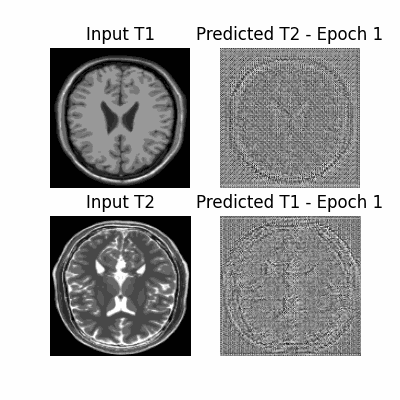

In [ ]:
# Visualizing the progress from epoch to epoch
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

### Conclusion
- We can see that a Cycle GAN architecture is effective in translating the style of T1 weighted MRI images to T2 weighted MRI image inputs, and vice versa.
- This can be very useful in more effective diagnosis, without the need of a second MRI scan. This not only saves time for the doctors, but would also reduce the financial burden on the patients.